In [1]:
# imports
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# settings for reproducibility
torch.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# misc
def parameter_count(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

class VGG(nn.Module):
    def __init__(self):
        super(VGG, self).__init__()
        
        channels_in = 3
        channels_out = 32
        
        layers = []
        for i in range(4):
            layers.append(nn.Conv2d(channels_in, channels_out, 3, stride=1, padding=1, bias=False))
            layers.append(nn.BatchNorm2d(channels_out))
            layers.append(nn.ReLU())
            channels_in = channels_out
            
            if(i%2==1):
                channels_out *=2
                layers.append(nn.MaxPool2d(2))

        layers.append(nn.Conv2d(channels_in, channels_in, 1, bias=False))
        layers.append(nn.BatchNorm2d(channels_in))
        layers.append(nn.ReLU())
        layers.append(nn.Conv2d(channels_in, 2, 1))
        
        self.features = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.features(x)

In [2]:
# load train/test dataset (this may take a minute or two)
!pip install -q wget
import wget
if not os.path.isfile('tcia_pancreas_data.pth'):
    print('downloading tcia pancreas data from https://cloud.imi.uni-luebeck.de/s/Z7LWqcbopfwzmKn/download')
    wget.download('https://cloud.imi.uni-luebeck.de/s/Z7LWqcbopfwzmKn/download')
    
imgs = torch.clamp(torch.load('tcia_pancreas_data.pth').float()/128-1, -1, 1)

### Task 0: Familiarize yourself with the data set and visualize some CT image slices

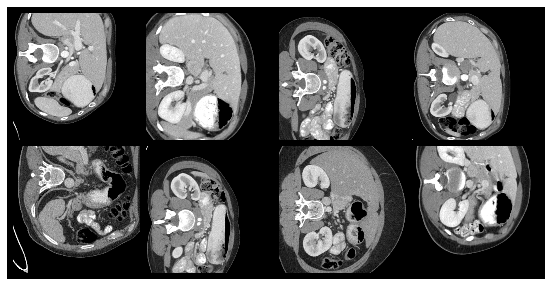

In [3]:
# visualise some data
img_list = []
for i in torch.randint(0, imgs.shape[0], (8,)):
    img_list.append(imgs[i])
img_batch = torch.stack(img_list)
img_grid = make_grid(img_batch, nrow=4, padding=12, pad_value=-1)

plt.figure(figsize=(20,5))
plt.imshow(img_grid[0], cmap='gray')
plt.axis('off')
plt.show()

### Task 1: Build a variational autoencoder architecture and train with KLD loss

1. Create an encoder that takes Bx3x256x256 input images and produces two 512 dim. latent vectors (μ and σ). Use nine blocks of Conv2d > BNorm > LeakyReLU with kernel size 3x3 and an increasing number of filter channels from 16 to 64. Use five stride=2 convolutions (every other layer) and padding=1. Add fully-connected layers with 1024 and then 512 channels (both implemented as Conv2d) the first one requires a kernel-size of 8x8.
2. Implement the decoder, which takes a Bx512x1x1 input and should generate a full-sized (Bx3x256x256) output image. Start with one fully-connected 1x1 Conv2d layer (512>1024 channels) followed by a ConvTranspose2d with kernel=8, channel-out=64 and no padding. Use then again blocks of Conv2d of kernel size 3x3, but alternate them with ConvTranspose2d of size 4x4 with stride 2. All these Conv-Layers should have appropriate padding and BNorm > LeakyReLU. Finish the architecture with a Conv2d with 3 output-channels and a tanh.
3. Build a VAE with your encoder-decoder architecture, you can directly follow the example from https://github.com/pytorch/examples/blob/master/vae/main.py.
Note: mu and log_var have to be returned after the forward path for loss calculations.
4.  Train this network for 160 epochs with batch size = 32, learning rate = 0.0025. Use the L1loss for the reconstruction of images and the Kullback-Leibler divergence (KLD) as shown in the example. Visualise some reconstructed examples after every 15 epoch (given a training image as input) as well as synthetically created examples, you can simply pass a torch.randn(B, 512,1,1) tensor to the decode function of your VAE model.

In [4]:
# definition of vae model
class Conv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(Conv, self).__init__()
        
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)
    
class ConvTranspose(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(ConvTranspose, self).__init__()
        
        self.conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        base = 16
        
        self.encoder = nn.Sequential(
            Conv(3, base, 3, stride=2, padding=1),
            Conv(base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            nn.Conv2d(4*base, 64*base, 8),
            nn.LeakyReLU()
        )
        self.encoder_mu = nn.Conv2d(64*base, 32*base, 1)
        self.encoder_logvar = nn.Conv2d(64*base, 32*base, 1)
        
        self.decoder = nn.Sequential(
            nn.Conv2d(32*base, 64*base, 1),
            ConvTranspose(64*base, 4*base, 8),
            Conv(4*base, 4*base, 3, padding=1),
            ConvTranspose(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            ConvTranspose(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 2*base, 3, padding=1),
            ConvTranspose(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            ConvTranspose(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, base, 3, padding=1),
            ConvTranspose(base, base, 4, stride=2, padding=1),
            nn.Conv2d(base, 3, 3, padding=1),
            nn.Tanh()
        )
        
    def encode(self, x):
        x = self.encoder(x)
        return self.encoder_mu(x), self.encoder_logvar(x)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
    
    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

print('parameter count:', parameter_count(VAE()))

parameter count: 10402371


Epoch 1 -- loss: 0.3791
Epoch 2 -- loss: 0.3018
Epoch 3 -- loss: 0.2935
Epoch 4 -- loss: 0.2869
Epoch 5 -- loss: 0.2863
Epoch 6 -- loss: 0.2830
Epoch 7 -- loss: 0.2828
Epoch 8 -- loss: 0.2795
Epoch 9 -- loss: 0.2790
Epoch 10 -- loss: 0.2765
Epoch 11 -- loss: 0.2746
Epoch 12 -- loss: 0.2715
Epoch 13 -- loss: 0.2700
Epoch 14 -- loss: 0.2674
Epoch 15 -- loss: 0.2681


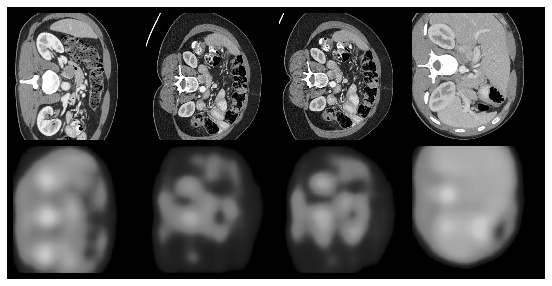

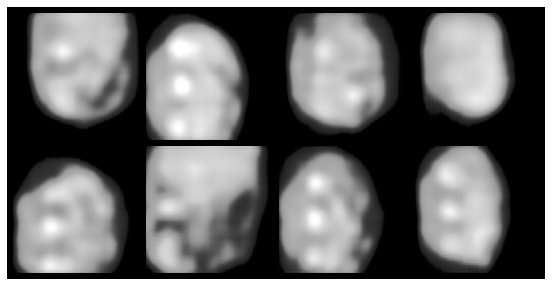

Epoch 16 -- loss: 0.2672
Epoch 17 -- loss: 0.2658
Epoch 18 -- loss: 0.2645
Epoch 19 -- loss: 0.2638
Epoch 20 -- loss: 0.2638
Epoch 21 -- loss: 0.2622
Epoch 22 -- loss: 0.2604
Epoch 23 -- loss: 0.2608
Epoch 24 -- loss: 0.2618
Epoch 25 -- loss: 0.2614
Epoch 26 -- loss: 0.2582
Epoch 27 -- loss: 0.2587
Epoch 28 -- loss: 0.2576
Epoch 29 -- loss: 0.2582
Epoch 30 -- loss: 0.2596


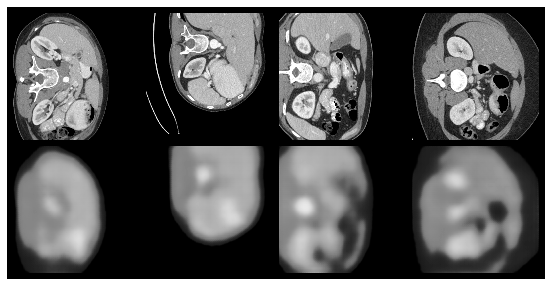

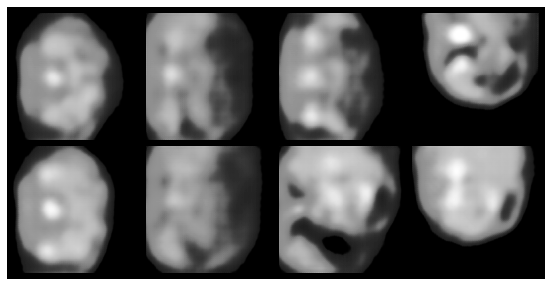

Epoch 31 -- loss: 0.2568
Epoch 32 -- loss: 0.2564
Epoch 33 -- loss: 0.2558
Epoch 34 -- loss: 0.2543
Epoch 35 -- loss: 0.2553
Epoch 36 -- loss: 0.2515
Epoch 37 -- loss: 0.2520
Epoch 38 -- loss: 0.2495
Epoch 39 -- loss: 0.2475
Epoch 40 -- loss: 0.2468
Epoch 41 -- loss: 0.2444
Epoch 42 -- loss: 0.2433
Epoch 43 -- loss: 0.2421
Epoch 44 -- loss: 0.2400
Epoch 45 -- loss: 0.2389


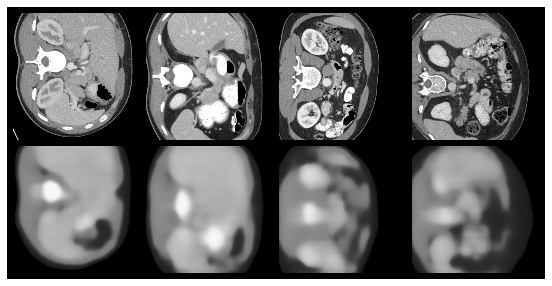

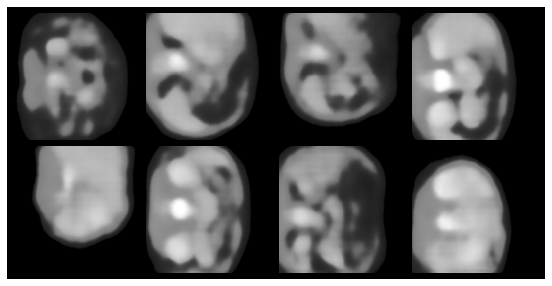

Epoch 46 -- loss: 0.2359
Epoch 47 -- loss: 0.2342
Epoch 48 -- loss: 0.2321
Epoch 49 -- loss: 0.2309
Epoch 50 -- loss: 0.2270
Epoch 51 -- loss: 0.2248
Epoch 52 -- loss: 0.2227
Epoch 53 -- loss: 0.2220
Epoch 54 -- loss: 0.2201
Epoch 55 -- loss: 0.2181
Epoch 56 -- loss: 0.2154
Epoch 57 -- loss: 0.2136
Epoch 58 -- loss: 0.2137
Epoch 59 -- loss: 0.2127
Epoch 60 -- loss: 0.2107


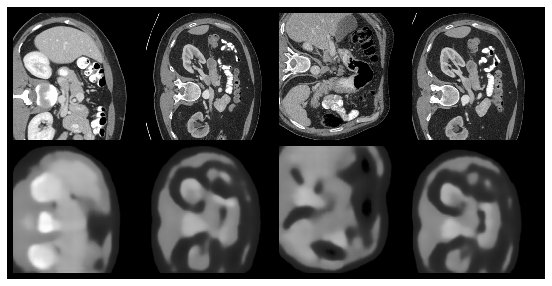

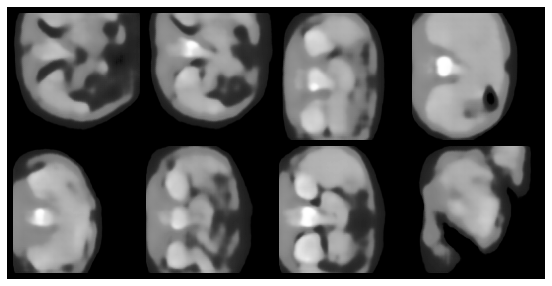

Epoch 61 -- loss: 0.2095
Epoch 62 -- loss: 0.2080
Epoch 63 -- loss: 0.2091
Epoch 64 -- loss: 0.2076
Epoch 65 -- loss: 0.2071
Epoch 66 -- loss: 0.2062
Epoch 67 -- loss: 0.2056
Epoch 68 -- loss: 0.2042
Epoch 69 -- loss: 0.2039
Epoch 70 -- loss: 0.2031
Epoch 71 -- loss: 0.2019
Epoch 72 -- loss: 0.2021
Epoch 73 -- loss: 0.2010
Epoch 74 -- loss: 0.2010
Epoch 75 -- loss: 0.2004


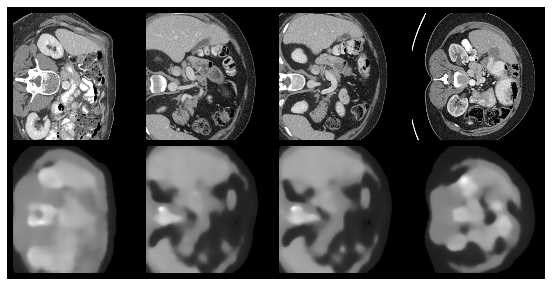

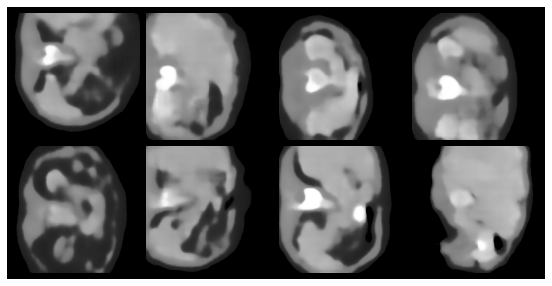

Epoch 76 -- loss: 0.2002
Epoch 77 -- loss: 0.1993
Epoch 78 -- loss: 0.1983
Epoch 79 -- loss: 0.1981
Epoch 80 -- loss: 0.1968
Epoch 81 -- loss: 0.1968
Epoch 82 -- loss: 0.1957
Epoch 83 -- loss: 0.1954
Epoch 84 -- loss: 0.1959
Epoch 85 -- loss: 0.1949
Epoch 86 -- loss: 0.1945
Epoch 87 -- loss: 0.1940
Epoch 88 -- loss: 0.1932
Epoch 89 -- loss: 0.1919
Epoch 90 -- loss: 0.1928


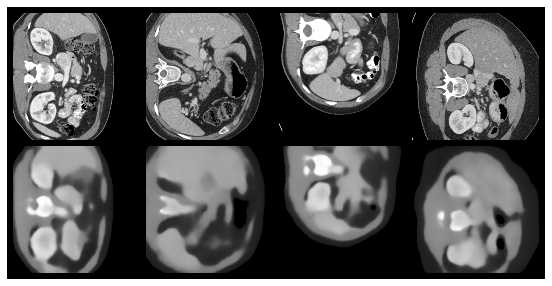

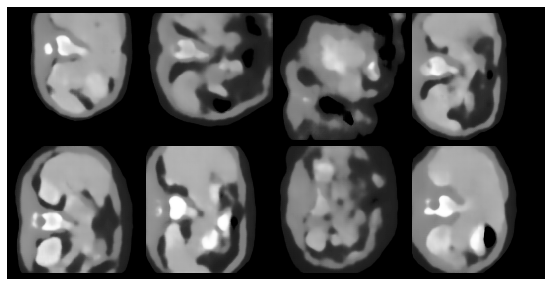

Epoch 91 -- loss: 0.1914
Epoch 92 -- loss: 0.1910
Epoch 93 -- loss: 0.1905
Epoch 94 -- loss: 0.1899
Epoch 95 -- loss: 0.1901
Epoch 96 -- loss: 0.1890
Epoch 97 -- loss: 0.1889
Epoch 98 -- loss: 0.1878
Epoch 99 -- loss: 0.1868
Epoch 100 -- loss: 0.1869
Epoch 101 -- loss: 0.1861
Epoch 102 -- loss: 0.1860
Epoch 103 -- loss: 0.1856
Epoch 104 -- loss: 0.1856
Epoch 105 -- loss: 0.1853


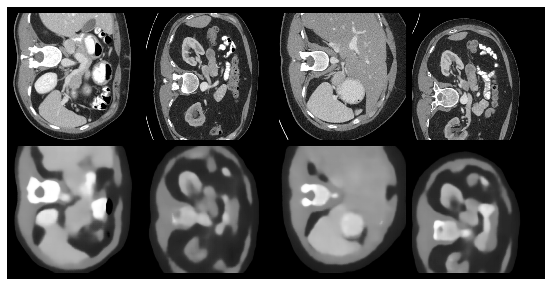

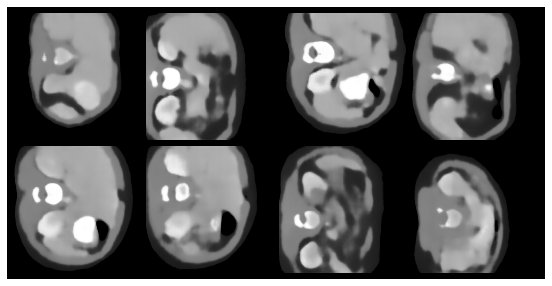

Epoch 106 -- loss: 0.1836
Epoch 107 -- loss: 0.1844
Epoch 108 -- loss: 0.1830
Epoch 109 -- loss: 0.1827
Epoch 110 -- loss: 0.1844
Epoch 111 -- loss: 0.1825
Epoch 112 -- loss: 0.1830
Epoch 113 -- loss: 0.1828
Epoch 114 -- loss: 0.1815
Epoch 115 -- loss: 0.1818
Epoch 116 -- loss: 0.1815
Epoch 117 -- loss: 0.1814
Epoch 118 -- loss: 0.1810
Epoch 119 -- loss: 0.1804
Epoch 120 -- loss: 0.1808


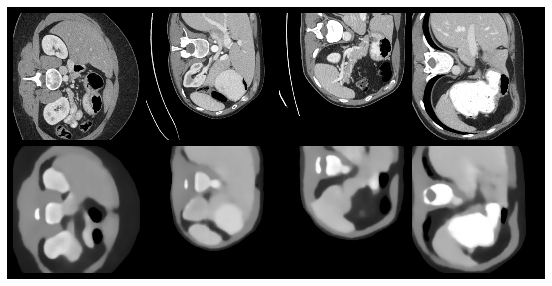

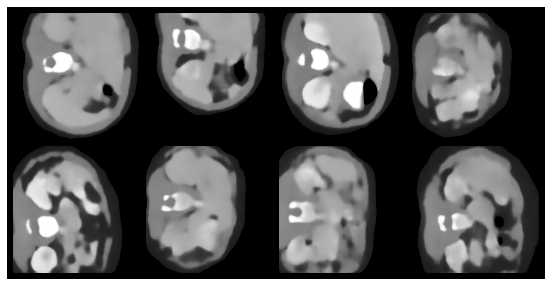

Epoch 121 -- loss: 0.1800
Epoch 122 -- loss: 0.1802
Epoch 123 -- loss: 0.1803
Epoch 124 -- loss: 0.1803
Epoch 125 -- loss: 0.1800
Epoch 126 -- loss: 0.1794
Epoch 127 -- loss: 0.1787
Epoch 128 -- loss: 0.1792
Epoch 129 -- loss: 0.1786
Epoch 130 -- loss: 0.1781
Epoch 131 -- loss: 0.1785
Epoch 132 -- loss: 0.1785
Epoch 133 -- loss: 0.1777
Epoch 134 -- loss: 0.1773
Epoch 135 -- loss: 0.1772


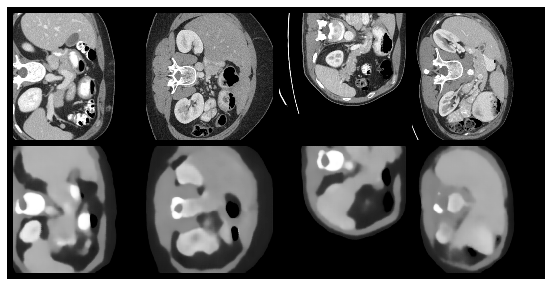

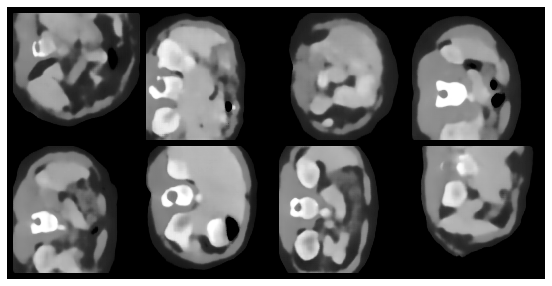

Epoch 136 -- loss: 0.1767
Epoch 137 -- loss: 0.1766
Epoch 138 -- loss: 0.1769
Epoch 139 -- loss: 0.1764
Epoch 140 -- loss: 0.1761
Epoch 141 -- loss: 0.1767
Epoch 142 -- loss: 0.1769
Epoch 143 -- loss: 0.1760
Epoch 144 -- loss: 0.1764
Epoch 145 -- loss: 0.1760
Epoch 146 -- loss: 0.1760
Epoch 147 -- loss: 0.1754
Epoch 148 -- loss: 0.1755
Epoch 149 -- loss: 0.1758
Epoch 150 -- loss: 0.1749


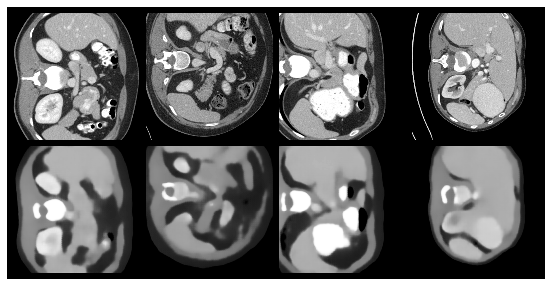

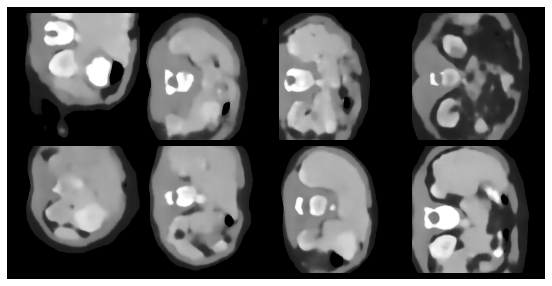

Epoch 151 -- loss: 0.1753
Epoch 152 -- loss: 0.1740
Epoch 153 -- loss: 0.1741
Epoch 154 -- loss: 0.1747
Epoch 155 -- loss: 0.1740
Epoch 156 -- loss: 0.1738
Epoch 157 -- loss: 0.1737
Epoch 158 -- loss: 0.1738
Epoch 159 -- loss: 0.1734
Epoch 160 -- loss: 0.1735


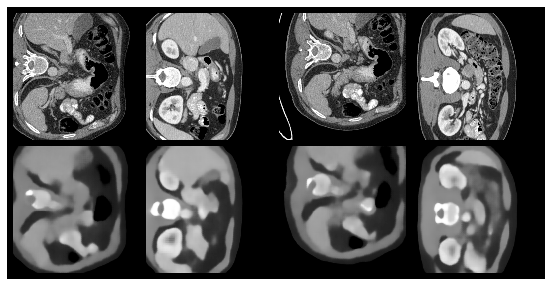

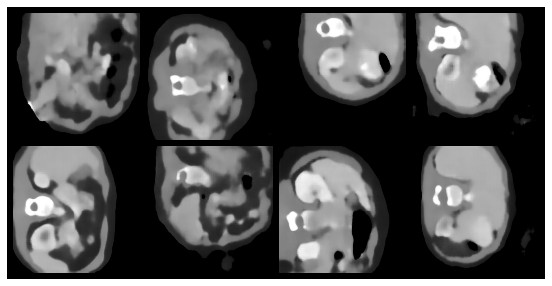

In [5]:
# train vae with perceptual loss

# parameters
batch_size = 32
init_lr = 0.0025
num_epochs = 160

# data
class TCIAPancreasDataset(Dataset):
    def __init__(self, imgs):
        self.imgs = imgs
        
    def __len__(self):
        return self.imgs.shape[0]
    
    def __getitem__(self, idx):
        img = self.imgs[idx]
        return img
    
data_set = TCIAPancreasDataset(imgs)
data_loader = DataLoader(data_set, batch_size, shuffle=True, num_workers=4, pin_memory=True, drop_last=True)

# model
vae = VAE()
vae.cuda()

# optimizer
optimizer = optim.Adam(vae.parameters(), lr=init_lr)

# criterion
l1_loss = nn.L1Loss()    

def kld_loss(mu, logvar):
    return (-0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()))

def criterion(img_batch, recon, mu, logvar):
    return l1_loss(recon, img_batch) + kld_loss(mu, logvar)

# statistics
train_losses = []
test_losses = []

# for num_epochs
for epoch in range(num_epochs):
  
    # train mode
    vae.train()
    
    # statistics
    running_loss = 0.0
    
    # for each mini-batch
    for img_batch in data_loader:

        # to GPU
        img_batch = img_batch.cuda()
        
        # zero the parameter gradients
        optimizer.zero_grad()
        
        # forward + backward + optimize
        recon, mu, logvar = vae(img_batch)
        loss = criterion(img_batch, recon, mu, logvar)
        loss.backward()
        optimizer.step()
        
        # statistics
        running_loss += loss.item()
    
    running_loss /= (len(data_set) // batch_size)
    
    train_losses.append(running_loss)
    
    # output
    print('Epoch {} -- loss: {:.4f}'.format(epoch + 1, running_loss))
    
    # visualize reconstruction and synthesis
    if((epoch%15==14) or (epoch==num_epochs-1)):
        img_grid = make_grid(torch.cat((img_batch[:4], recon[:4])), nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()
        
        sample = torch.randn(8, 512, 1, 1).cuda()
        recon = vae.decode(sample)
        img_grid = make_grid(recon, nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()

### Task 2: Implement a perceptual loss and add this to your VAE training

A pre-trained fully-convolutional network which roughly follows the VGG architecture that has been trained for CT segmentation is provided for this task. 

1. Implement a forward hook function to extract perceptual features from after the ReLUs in layers 2, 5 and 9. You can use the following snippet to store the output during a forward path: 

```
def get_output():
    def hook(model, input, output):
        model.output = output
    return hook
```

2. Next you need to call the method register_forward_hook for layers 2, 5 and 9 with get_output as function argument. After a forward path of your ground truth (training) image through the vgg_model you can copy the output tensors to a list of tensors. Repeat the same procedure after passing the reconstructed image through your network.  Use the L1Loss between those two feature tensors for all three layers as additional perceptual loss and retrain the network from scratch. Visualise the outputs to see whether there are any improvements.

Epoch 1 -- loss: 2.5837
Epoch 2 -- loss: 1.7837
Epoch 3 -- loss: 1.5361
Epoch 4 -- loss: 1.4925
Epoch 5 -- loss: 1.4641
Epoch 6 -- loss: 1.4451
Epoch 7 -- loss: 1.4367
Epoch 8 -- loss: 1.4281
Epoch 9 -- loss: 1.4195
Epoch 10 -- loss: 1.4093
Epoch 11 -- loss: 1.4002
Epoch 12 -- loss: 1.3937
Epoch 13 -- loss: 1.3836
Epoch 14 -- loss: 1.3818
Epoch 15 -- loss: 1.3692


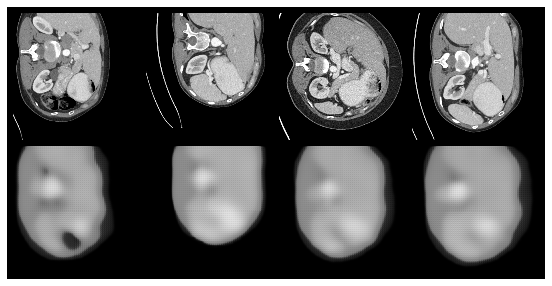

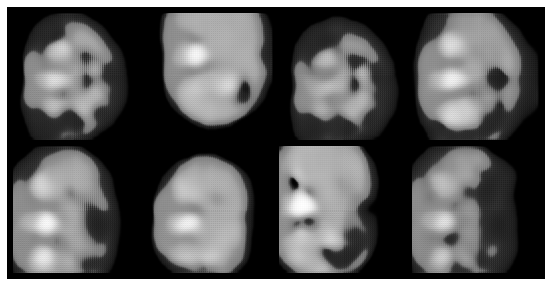

Epoch 16 -- loss: 1.3613
Epoch 17 -- loss: 1.3545
Epoch 18 -- loss: 1.3502
Epoch 19 -- loss: 1.3338
Epoch 20 -- loss: 1.3263
Epoch 21 -- loss: 1.3110
Epoch 22 -- loss: 1.3062
Epoch 23 -- loss: 1.2975
Epoch 24 -- loss: 1.2913
Epoch 25 -- loss: 1.2795
Epoch 26 -- loss: 1.2770
Epoch 27 -- loss: 1.2647
Epoch 28 -- loss: 1.2606
Epoch 29 -- loss: 1.2537
Epoch 30 -- loss: 1.2454


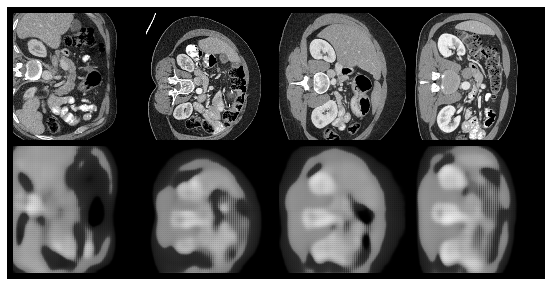

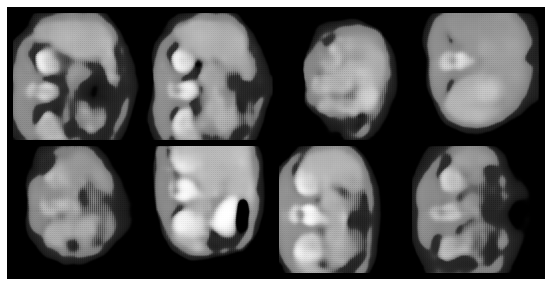

Epoch 31 -- loss: 1.2360
Epoch 32 -- loss: 1.2274
Epoch 33 -- loss: 1.2226
Epoch 34 -- loss: 1.2158
Epoch 35 -- loss: 1.2097
Epoch 36 -- loss: 1.2075
Epoch 37 -- loss: 1.2067
Epoch 38 -- loss: 1.1960
Epoch 39 -- loss: 1.1926
Epoch 40 -- loss: 1.1904
Epoch 41 -- loss: 1.1836
Epoch 42 -- loss: 1.1834
Epoch 43 -- loss: 1.1775
Epoch 44 -- loss: 1.1759
Epoch 45 -- loss: 1.1751


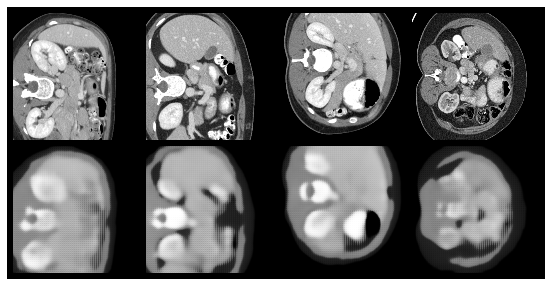

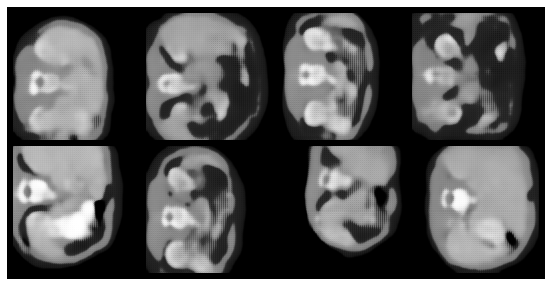

Epoch 46 -- loss: 1.1693
Epoch 47 -- loss: 1.1709
Epoch 48 -- loss: 1.1645
Epoch 49 -- loss: 1.1678
Epoch 50 -- loss: 1.1594
Epoch 51 -- loss: 1.1561
Epoch 52 -- loss: 1.1592
Epoch 53 -- loss: 1.1549
Epoch 54 -- loss: 1.1528
Epoch 55 -- loss: 1.1488
Epoch 56 -- loss: 1.1425
Epoch 57 -- loss: 1.1440
Epoch 58 -- loss: 1.1396
Epoch 59 -- loss: 1.1369
Epoch 60 -- loss: 1.1369


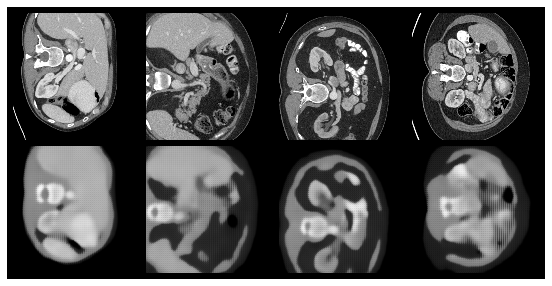

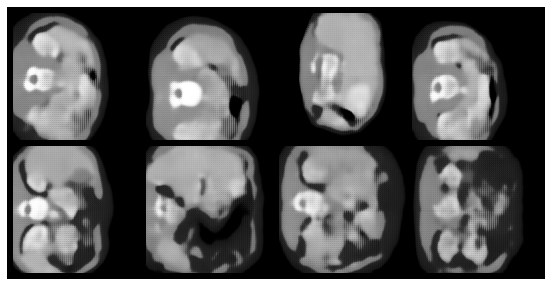

Epoch 61 -- loss: 1.1343
Epoch 62 -- loss: 1.1311
Epoch 63 -- loss: 1.1295
Epoch 64 -- loss: 1.1240
Epoch 65 -- loss: 1.1271
Epoch 66 -- loss: 1.1283
Epoch 67 -- loss: 1.1223
Epoch 68 -- loss: 1.1207
Epoch 69 -- loss: 1.1153
Epoch 70 -- loss: 1.1179
Epoch 71 -- loss: 1.1150
Epoch 72 -- loss: 1.1164
Epoch 73 -- loss: 1.1123
Epoch 74 -- loss: 1.1158
Epoch 75 -- loss: 1.1110


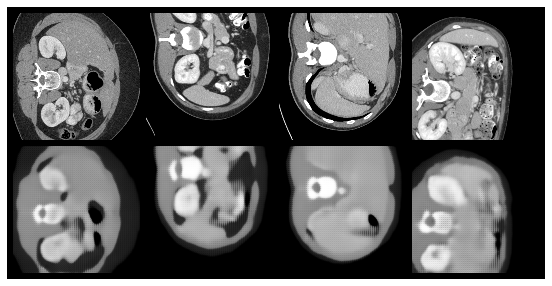

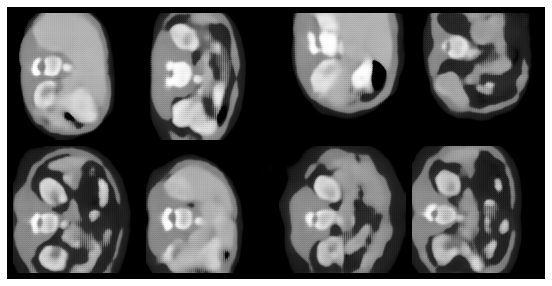

Epoch 76 -- loss: 1.1112
Epoch 77 -- loss: 1.1088
Epoch 78 -- loss: 1.1077
Epoch 79 -- loss: 1.1039
Epoch 80 -- loss: 1.1060
Epoch 81 -- loss: 1.1039
Epoch 82 -- loss: 1.0996
Epoch 83 -- loss: 1.1032
Epoch 84 -- loss: 1.0984
Epoch 85 -- loss: 1.1010
Epoch 86 -- loss: 1.0980
Epoch 87 -- loss: 1.0923
Epoch 88 -- loss: 1.0924
Epoch 89 -- loss: 1.0938
Epoch 90 -- loss: 1.0944


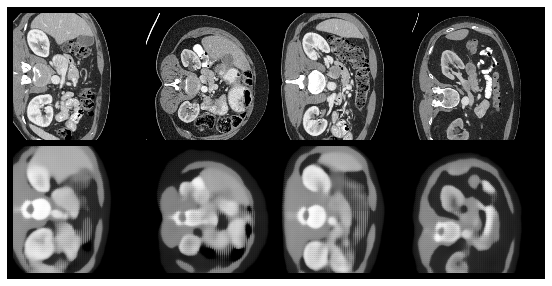

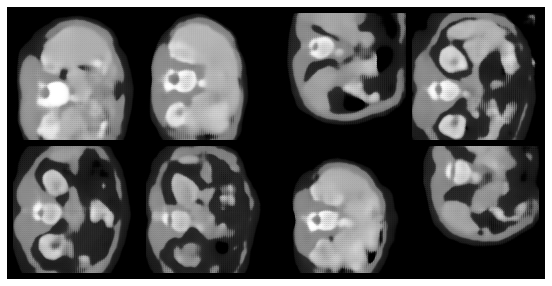

Epoch 91 -- loss: 1.0920
Epoch 92 -- loss: 1.0899
Epoch 93 -- loss: 1.0872
Epoch 94 -- loss: 1.0904
Epoch 95 -- loss: 1.0859
Epoch 96 -- loss: 1.0865
Epoch 97 -- loss: 1.0859
Epoch 98 -- loss: 1.0857
Epoch 99 -- loss: 1.0828
Epoch 100 -- loss: 1.0808
Epoch 101 -- loss: 1.0784
Epoch 102 -- loss: 1.0827
Epoch 103 -- loss: 1.0765
Epoch 104 -- loss: 1.0813
Epoch 105 -- loss: 1.0760


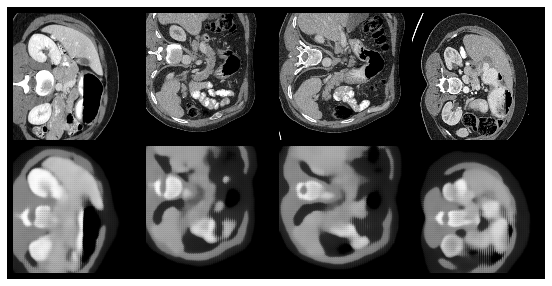

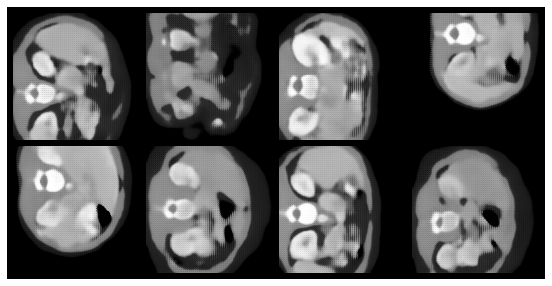

Epoch 106 -- loss: 1.0787
Epoch 107 -- loss: 1.0777
Epoch 108 -- loss: 1.0749
Epoch 109 -- loss: 1.0727
Epoch 110 -- loss: 1.0727
Epoch 111 -- loss: 1.0719
Epoch 112 -- loss: 1.0752
Epoch 113 -- loss: 1.0697
Epoch 114 -- loss: 1.0723
Epoch 115 -- loss: 1.0718
Epoch 116 -- loss: 1.0708
Epoch 117 -- loss: 1.0698
Epoch 118 -- loss: 1.0642
Epoch 119 -- loss: 1.0644
Epoch 120 -- loss: 1.0657


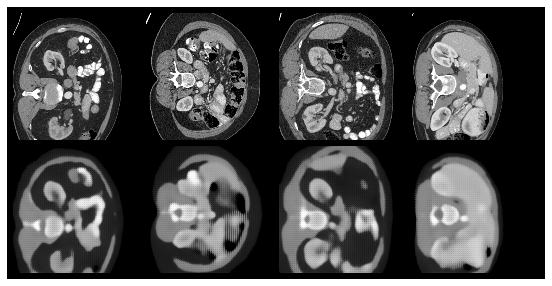

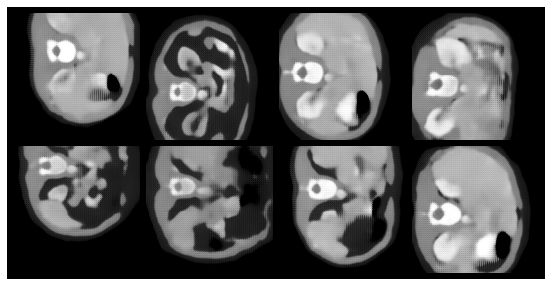

Epoch 121 -- loss: 1.0662
Epoch 122 -- loss: 1.0642
Epoch 123 -- loss: 1.0635
Epoch 124 -- loss: 1.0597
Epoch 125 -- loss: 1.0629
Epoch 126 -- loss: 1.0618
Epoch 127 -- loss: 1.0573
Epoch 128 -- loss: 1.0582
Epoch 129 -- loss: 1.0560
Epoch 130 -- loss: 1.0580
Epoch 131 -- loss: 1.0569
Epoch 132 -- loss: 1.0575
Epoch 133 -- loss: 1.0560
Epoch 134 -- loss: 1.0572
Epoch 135 -- loss: 1.0533


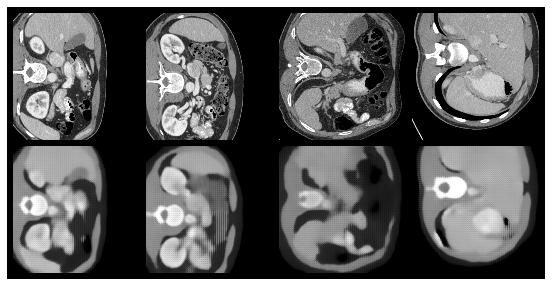

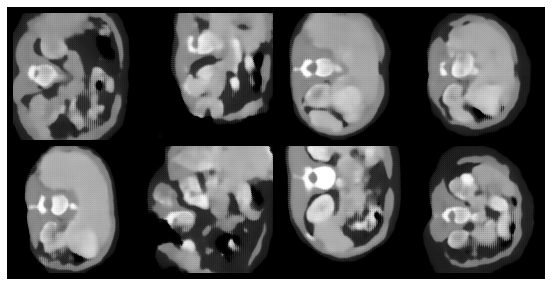

Epoch 136 -- loss: 1.0520
Epoch 137 -- loss: 1.0489
Epoch 138 -- loss: 1.0506
Epoch 139 -- loss: 1.0465
Epoch 140 -- loss: 1.0500
Epoch 141 -- loss: 1.0474
Epoch 142 -- loss: 1.0467
Epoch 143 -- loss: 1.0428
Epoch 144 -- loss: 1.0447
Epoch 145 -- loss: 1.0470
Epoch 146 -- loss: 1.0452
Epoch 147 -- loss: 1.0434
Epoch 148 -- loss: 1.0377
Epoch 149 -- loss: 1.0414
Epoch 150 -- loss: 1.0408


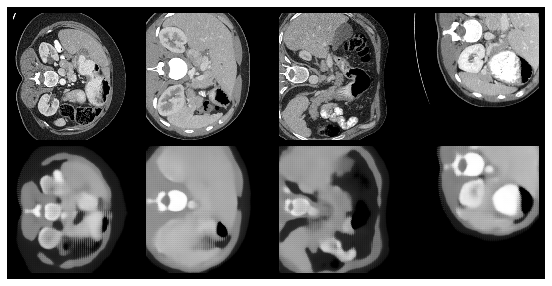

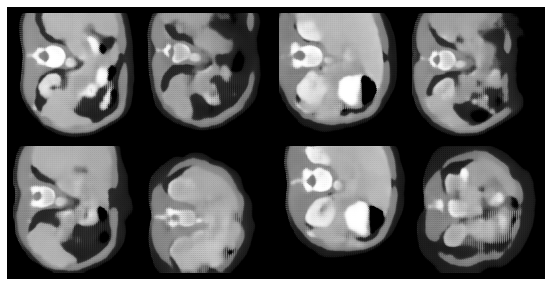

Epoch 151 -- loss: 1.0379
Epoch 152 -- loss: 1.0357
Epoch 153 -- loss: 1.0402
Epoch 154 -- loss: 1.0336
Epoch 155 -- loss: 1.0349
Epoch 156 -- loss: 1.0330
Epoch 157 -- loss: 1.0416
Epoch 158 -- loss: 1.0363
Epoch 159 -- loss: 1.0373
Epoch 160 -- loss: 1.0343


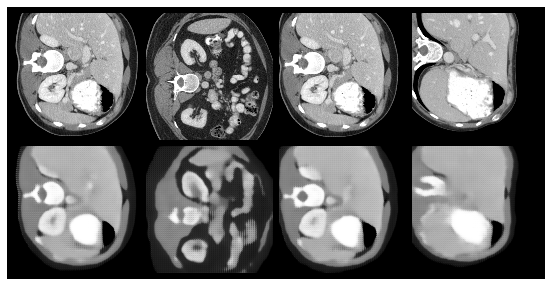

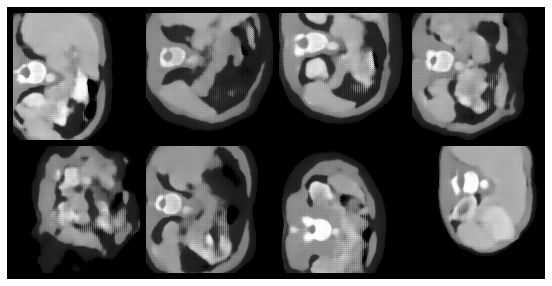

In [6]:
# train vae with perceptual loss

# parameters
batch_size = 32
init_lr = 0.0025
num_epochs = 160

# data
class TCIAPancreasDataset(Dataset):
    def __init__(self, imgs):
        self.imgs = imgs
        
    def __len__(self):
        return self.imgs.shape[0]
    
    def __getitem__(self, idx):
        img = self.imgs[idx]
        return img
    
data_set = TCIAPancreasDataset(imgs)
data_loader = DataLoader(data_set, batch_size, shuffle=True, num_workers=4, pin_memory=True, drop_last=True)

# model
vae = VAE()
vae.cuda()

# optimizer
optimizer = optim.Adam(vae.parameters(), lr=init_lr)

# criterion
vgg = VGG()

if not os.path.isfile('tcia_pancreas_vgg.pth'):
    print('downloading tcia pancreas vgg model from https://cloud.imi.uni-luebeck.de/s/xJ8edbQ3mmZK7Tg/download')
    wget.download('https://cloud.imi.uni-luebeck.de/s/xJ8edbQ3mmZK7Tg/download')                       
vgg_state_dict = torch.load('tcia_pancreas_vgg.pth')
vgg.features.load_state_dict(vgg_state_dict, False)
vgg.cuda()
vgg.eval()

def get_output():
    def hook(model, input, output):
        model.output = output
    return hook

layer = [2,5,9]
for i in layer:
    vgg.features[i].register_forward_hook(get_output())

l1_loss = nn.L1Loss()    
    
def perceptual_loss(img_batch, recon):
    with torch.no_grad():
        img_batch_out = vgg(img_batch)
    features_img_batch = []
    for i in layer:
        features_img_batch.append(vgg.features[i].output)
        
    recon_out = vgg(recon)
    features_recon = []
    for i in layer:
        features_recon.append(vgg.features[i].output)
    
    loss = 0.0
    for i in range(len(layer)):
        loss += l1_loss(features_recon[i], features_img_batch[i])
        
    return loss

def kld_loss(mu, logvar):
    return (-0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()))

def criterion(img_batch, recon, mu, logvar):
    return l1_loss(recon, img_batch) + kld_loss(mu, logvar) + perceptual_loss(img_batch, recon)

# statistics
train_losses = []
test_losses = []

# for num_epochs
for epoch in range(num_epochs):
  
    # train mode
    vae.train()
    
    # statistics
    running_loss = 0.0
    
    # for each mini-batch
    for img_batch in data_loader:

        # to GPU
        img_batch = img_batch.cuda()
        
        # zero the parameter gradients
        optimizer.zero_grad()
        
        # forward + backward + optimize
        recon, mu, logvar = vae(img_batch)
        loss = criterion(img_batch, recon, mu, logvar)
        loss.backward()
        optimizer.step()
        
        # statistics
        running_loss += loss.item()
    
    running_loss /= (len(data_set) // batch_size)
    
    train_losses.append(running_loss)
    
    # output
    print('Epoch {} -- loss: {:.4f}'.format(epoch + 1, running_loss))
    
    # visualize reconstruction and synthesis
    if((epoch%15==14) or (epoch==num_epochs-1)):
        img_grid = make_grid(torch.cat((img_batch[:4], recon[:4])), nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()
        
        sample = torch.randn(8, 512, 1, 1).cuda()
        recon = vae.decode(sample)
        img_grid = make_grid(recon, nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()

### Task 3: Adress the checkerboard pattern in the synthetically generated images
1. As described in the following blog article: https://distill.pub/2016/deconv-checkerboard/ the checkerboard could be reduced by replacing transpose convolutions with bilinear upsampling. Explore how and whether you can visually improve your synthetic image generation like that.

In [7]:
# definition of vae model
class Conv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(Conv, self).__init__()
        
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)
    
class ConvTranspose(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(ConvTranspose, self).__init__()
        
        self.conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)
    
class ConvUpsampling(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(ConvUpsampling, self).__init__()
        
        self.scale_factor = kernel_size
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        x = F.interpolate(x, scale_factor=self.scale_factor, mode='bilinear')
        return self.conv(x)

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        base = 16
        
        self.encoder = nn.Sequential(
            Conv(3, base, 3, stride=2, padding=1),
            Conv(base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            nn.Conv2d(4*base, 64*base, 8),
            nn.LeakyReLU()
        )
        self.encoder_mu = nn.Conv2d(64*base, 32*base, 1)
        self.encoder_logvar = nn.Conv2d(64*base, 32*base, 1)
        
        self.decoder = nn.Sequential(
            nn.Conv2d(32*base, 64*base, 1),
            ConvTranspose(64*base, 4*base, 8),
            Conv(4*base, 4*base, 3, padding=1),
            ConvUpsampling(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            ConvUpsampling(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 2*base, 3, padding=1),
            ConvUpsampling(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            ConvUpsampling(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, base, 3, padding=1),
            ConvUpsampling(base, base, 4, stride=2, padding=1),
            nn.Conv2d(base, 3, 3, padding=1),
            nn.Tanh()
        )
        
    def encode(self, x):
        x = self.encoder(x)
        return self.encoder_mu(x), self.encoder_logvar(x)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
    
    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

print('parameter count:', parameter_count(VAE()))

parameter count: 10402371


Epoch 1 -- loss: 1.7726
Epoch 2 -- loss: 1.5384
Epoch 3 -- loss: 1.5086
Epoch 4 -- loss: 1.4840
Epoch 5 -- loss: 1.4688
Epoch 6 -- loss: 1.4485
Epoch 7 -- loss: 1.4363
Epoch 8 -- loss: 1.4230
Epoch 9 -- loss: 1.4156
Epoch 10 -- loss: 1.4082
Epoch 11 -- loss: 1.3994
Epoch 12 -- loss: 1.3879
Epoch 13 -- loss: 1.3753
Epoch 14 -- loss: 1.3718
Epoch 15 -- loss: 1.3588


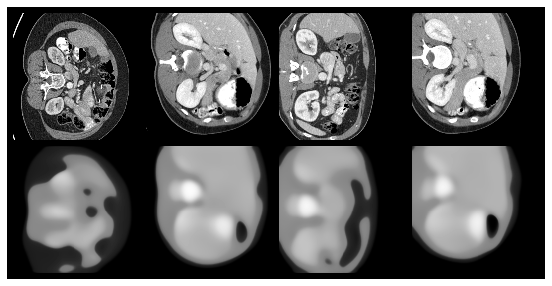

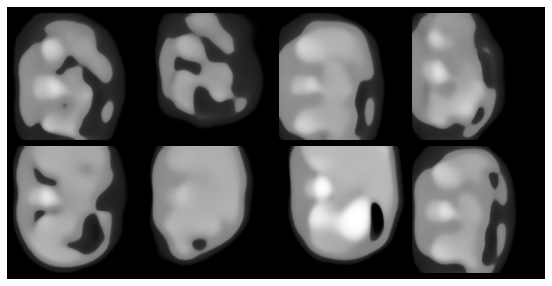

Epoch 16 -- loss: 1.3521
Epoch 17 -- loss: 1.3433
Epoch 18 -- loss: 1.3301
Epoch 19 -- loss: 1.3257
Epoch 20 -- loss: 1.3198
Epoch 21 -- loss: 1.3115
Epoch 22 -- loss: 1.3003
Epoch 23 -- loss: 1.2951
Epoch 24 -- loss: 1.2819
Epoch 25 -- loss: 1.2712
Epoch 26 -- loss: 1.2670
Epoch 27 -- loss: 1.2562
Epoch 28 -- loss: 1.2441
Epoch 29 -- loss: 1.2404
Epoch 30 -- loss: 1.2435


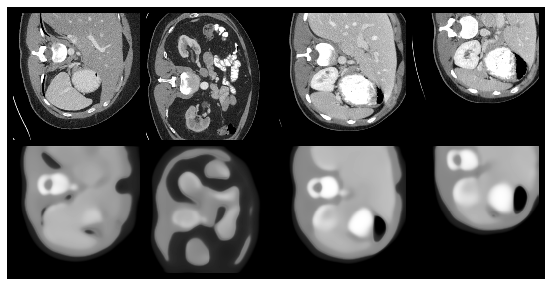

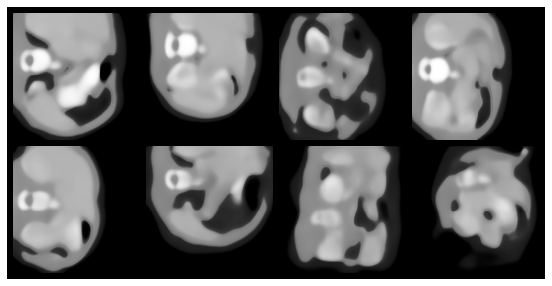

Epoch 31 -- loss: 1.2316
Epoch 32 -- loss: 1.2285
Epoch 33 -- loss: 1.2228
Epoch 34 -- loss: 1.2157
Epoch 35 -- loss: 1.2102
Epoch 36 -- loss: 1.2105
Epoch 37 -- loss: 1.2113
Epoch 38 -- loss: 1.2015
Epoch 39 -- loss: 1.1998
Epoch 40 -- loss: 1.1978
Epoch 41 -- loss: 1.1925
Epoch 42 -- loss: 1.1943
Epoch 43 -- loss: 1.1878
Epoch 44 -- loss: 1.1858
Epoch 45 -- loss: 1.1829


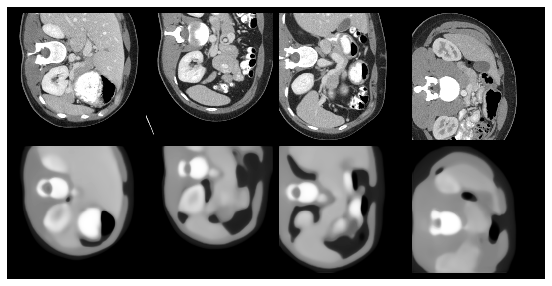

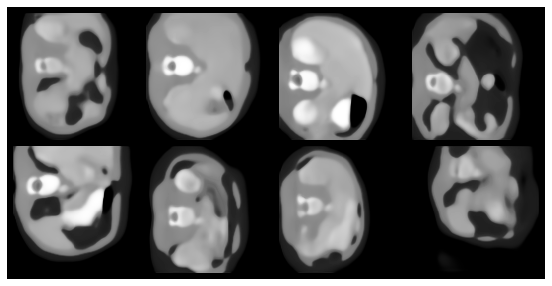

Epoch 46 -- loss: 1.1821
Epoch 47 -- loss: 1.1819
Epoch 48 -- loss: 1.1750
Epoch 49 -- loss: 1.1704
Epoch 50 -- loss: 1.1709
Epoch 51 -- loss: 1.1692
Epoch 52 -- loss: 1.1677
Epoch 53 -- loss: 1.1645
Epoch 54 -- loss: 1.1623
Epoch 55 -- loss: 1.1647
Epoch 56 -- loss: 1.1576
Epoch 57 -- loss: 1.1578
Epoch 58 -- loss: 1.1550
Epoch 59 -- loss: 1.1528
Epoch 60 -- loss: 1.1468


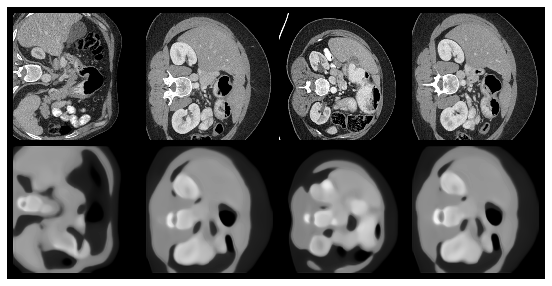

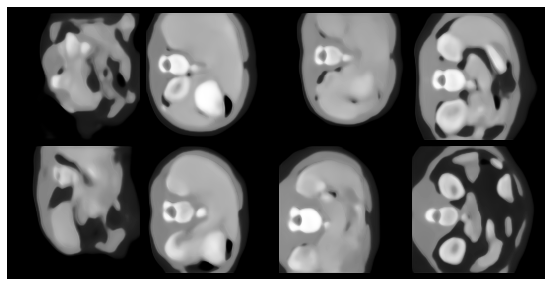

Epoch 61 -- loss: 1.1514
Epoch 62 -- loss: 1.1485
Epoch 63 -- loss: 1.1444
Epoch 64 -- loss: 1.1390
Epoch 65 -- loss: 1.1346
Epoch 66 -- loss: 1.1349
Epoch 67 -- loss: 1.1368
Epoch 68 -- loss: 1.1320
Epoch 69 -- loss: 1.1288
Epoch 70 -- loss: 1.1284
Epoch 71 -- loss: 1.1298
Epoch 72 -- loss: 1.1241
Epoch 73 -- loss: 1.1215
Epoch 74 -- loss: 1.1217
Epoch 75 -- loss: 1.1169


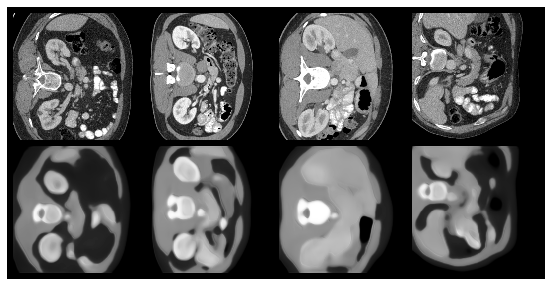

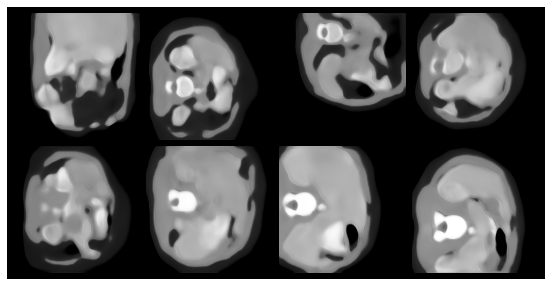

Epoch 76 -- loss: 1.1216
Epoch 77 -- loss: 1.1158
Epoch 78 -- loss: 1.1153
Epoch 79 -- loss: 1.1190
Epoch 80 -- loss: 1.1133
Epoch 81 -- loss: 1.1079
Epoch 82 -- loss: 1.1079
Epoch 83 -- loss: 1.1103
Epoch 84 -- loss: 1.1054
Epoch 85 -- loss: 1.1057
Epoch 86 -- loss: 1.1057
Epoch 87 -- loss: 1.0998
Epoch 88 -- loss: 1.0994
Epoch 89 -- loss: 1.0996
Epoch 90 -- loss: 1.0977


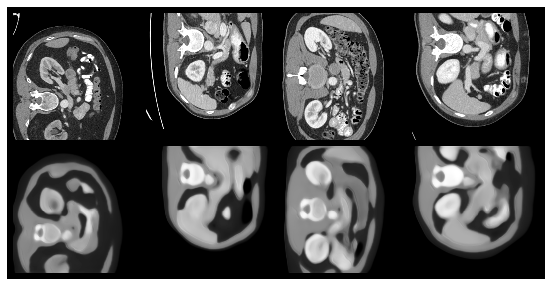

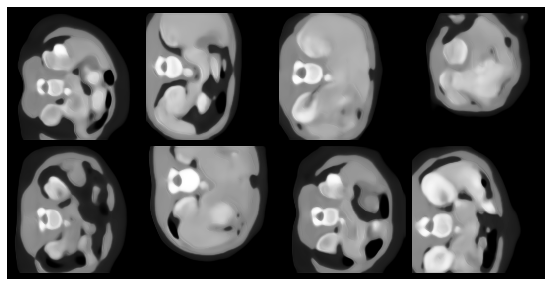

Epoch 91 -- loss: 1.0993
Epoch 92 -- loss: 1.0935
Epoch 93 -- loss: 1.0952
Epoch 94 -- loss: 1.0961
Epoch 95 -- loss: 1.0922
Epoch 96 -- loss: 1.0899
Epoch 97 -- loss: 1.0890
Epoch 98 -- loss: 1.0891
Epoch 99 -- loss: 1.0871
Epoch 100 -- loss: 1.0881
Epoch 101 -- loss: 1.0858
Epoch 102 -- loss: 1.0853
Epoch 103 -- loss: 1.0794
Epoch 104 -- loss: 1.0861
Epoch 105 -- loss: 1.0793


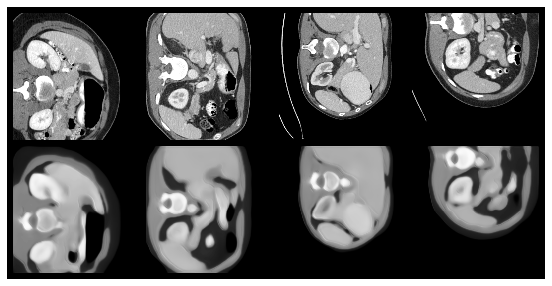

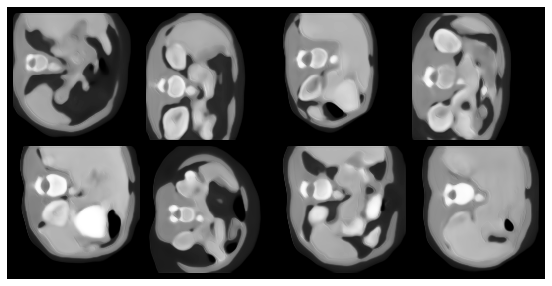

Epoch 106 -- loss: 1.0791
Epoch 107 -- loss: 1.0809
Epoch 108 -- loss: 1.0801
Epoch 109 -- loss: 1.0795
Epoch 110 -- loss: 1.0769
Epoch 111 -- loss: 1.0761
Epoch 112 -- loss: 1.0731
Epoch 113 -- loss: 1.0717
Epoch 114 -- loss: 1.0745
Epoch 115 -- loss: 1.0757
Epoch 116 -- loss: 1.0747
Epoch 117 -- loss: 1.0722
Epoch 118 -- loss: 1.0687
Epoch 119 -- loss: 1.0702
Epoch 120 -- loss: 1.0706


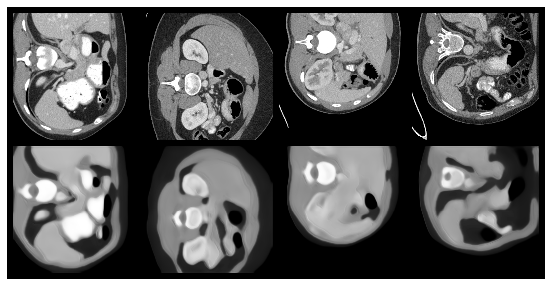

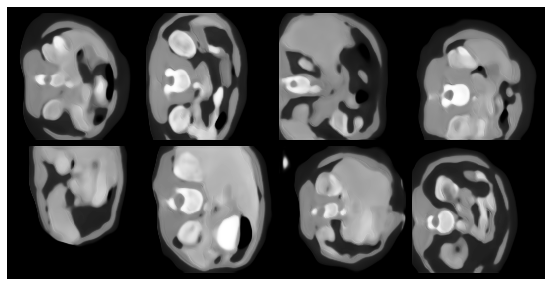

Epoch 121 -- loss: 1.0735
Epoch 122 -- loss: 1.0696
Epoch 123 -- loss: 1.0653
Epoch 124 -- loss: 1.0661
Epoch 125 -- loss: 1.0670
Epoch 126 -- loss: 1.0627
Epoch 127 -- loss: 1.0623
Epoch 128 -- loss: 1.0672
Epoch 129 -- loss: 1.0635
Epoch 130 -- loss: 1.0643
Epoch 131 -- loss: 1.0647
Epoch 132 -- loss: 1.0587
Epoch 133 -- loss: 1.0594
Epoch 134 -- loss: 1.0556
Epoch 135 -- loss: 1.0601


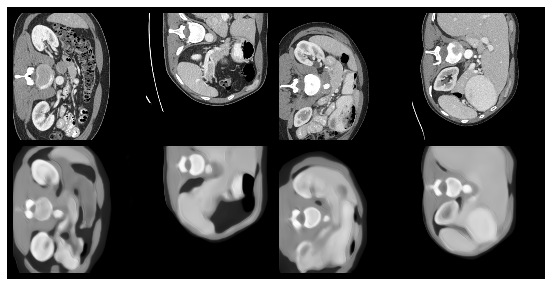

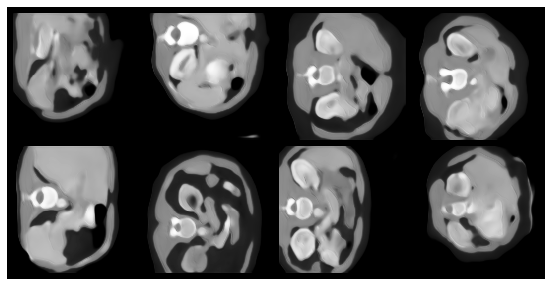

Epoch 136 -- loss: 1.0566
Epoch 137 -- loss: 1.0605
Epoch 138 -- loss: 1.0578
Epoch 139 -- loss: 1.0540
Epoch 140 -- loss: 1.0545
Epoch 141 -- loss: 1.0532
Epoch 142 -- loss: 1.0594
Epoch 143 -- loss: 1.0535
Epoch 144 -- loss: 1.0548
Epoch 145 -- loss: 1.0536
Epoch 146 -- loss: 1.0535
Epoch 147 -- loss: 1.0502
Epoch 148 -- loss: 1.0479
Epoch 149 -- loss: 1.0508
Epoch 150 -- loss: 1.0501


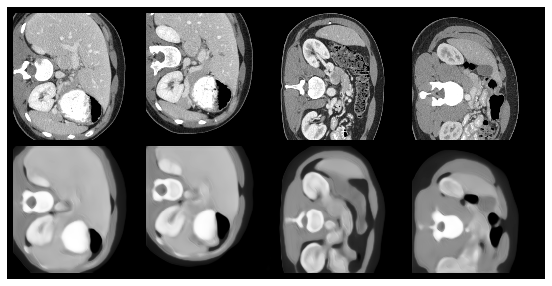

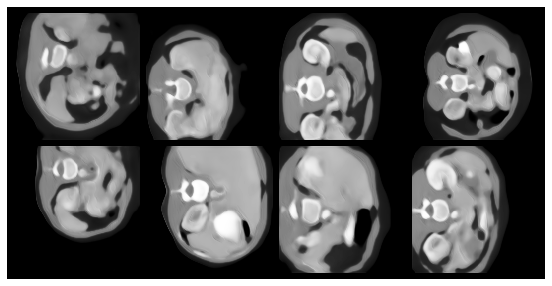

Epoch 151 -- loss: 1.0472
Epoch 152 -- loss: 1.0515
Epoch 153 -- loss: 1.0485
Epoch 154 -- loss: 1.0503
Epoch 155 -- loss: 1.0487
Epoch 156 -- loss: 1.0454
Epoch 157 -- loss: 1.0474
Epoch 158 -- loss: 1.0404
Epoch 159 -- loss: 1.0455
Epoch 160 -- loss: 1.0429


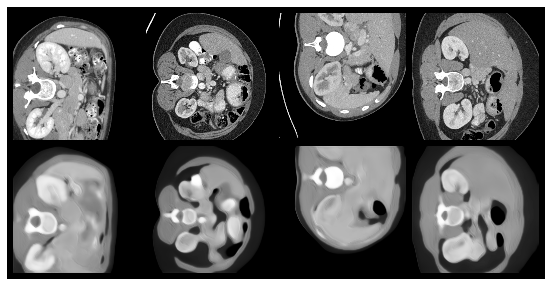

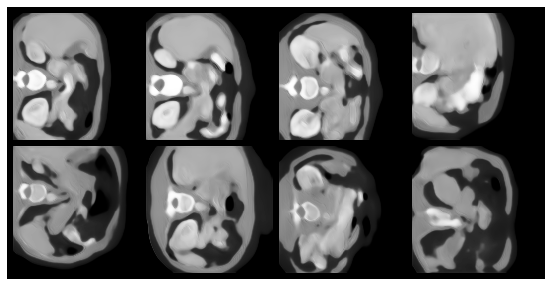

In [8]:
# train vae with perceptual loss and adress checkerboard pattern

# parameters
batch_size = 32
init_lr = 0.0025
num_epochs = 160

# data
class TCIAPancreasDataset(Dataset):
    def __init__(self, imgs):
        self.imgs = imgs
        
    def __len__(self):
        return self.imgs.shape[0]
    
    def __getitem__(self, idx):
        img = self.imgs[idx]
        return img
    
data_set = TCIAPancreasDataset(imgs)
data_loader = DataLoader(data_set, batch_size, shuffle=True, num_workers=4, pin_memory=True, drop_last=True)

# model
vae = VAE()
vae.cuda()

# optimizer
optimizer = optim.Adam(vae.parameters(), lr=init_lr)

# criterion
vgg = VGG()

if not os.path.isfile('tcia_pancreas_vgg.pth'):
    print('downloading tcia pancreas vgg model from https://cloud.imi.uni-luebeck.de/s/xJ8edbQ3mmZK7Tg/download')
    wget.download('https://cloud.imi.uni-luebeck.de/s/xJ8edbQ3mmZK7Tg/download')                       
vgg_state_dict = torch.load('tcia_pancreas_vgg.pth')
vgg.features.load_state_dict(vgg_state_dict, False)
vgg.cuda()
vgg.eval()

def get_output():
    def hook(model, input, output):
        model.output = output
    return hook

layer = [2,5,9]
for i in layer:
    vgg.features[i].register_forward_hook(get_output())

l1_loss = nn.L1Loss()    
    
def perceptual_loss(img_batch, recon):
    with torch.no_grad():
        img_batch_out = vgg(img_batch)
    features_img_batch = []
    for i in layer:
        features_img_batch.append(vgg.features[i].output)
        
    recon_out = vgg(recon)
    features_recon = []
    for i in layer:
        features_recon.append(vgg.features[i].output)
    
    loss = 0.0
    for i in range(len(layer)):
        loss += l1_loss(features_recon[i], features_img_batch[i])
        
    return loss

def kld_loss(mu, logvar):
    return (-0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()))

def criterion(img_batch, recon, mu, logvar):
    return l1_loss(recon, img_batch) + kld_loss(mu, logvar) + perceptual_loss(img_batch, recon)

# statistics
train_losses = []
test_losses = []

# for num_epochs
for epoch in range(num_epochs):
  
    # train mode
    vae.train()
    
    # statistics
    running_loss = 0.0
    
    # for each mini-batch
    for img_batch in data_loader:

        # to GPU
        img_batch = img_batch.cuda()
        
        # zero the parameter gradients
        optimizer.zero_grad()
        
        # forward + backward + optimize
        recon, mu, logvar = vae(img_batch)
        loss = criterion(img_batch, recon, mu, logvar)
        loss.backward()
        optimizer.step()
        
        # statistics
        running_loss += loss.item()
    
    running_loss /= (len(data_set) // batch_size)
    
    train_losses.append(running_loss)
    
    # output
    print('Epoch {} -- loss: {:.4f}'.format(epoch + 1, running_loss))
    
    # visualize reconstruction and synthesis
    if((epoch%15==14) or (epoch==num_epochs-1)):
        img_grid = make_grid(torch.cat((img_batch[:4], recon[:4])), nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()
        
        sample = torch.randn(8, 512, 1, 1).cuda()
        recon = vae.decode(sample)
        img_grid = make_grid(recon, nrow=4, padding=12, pad_value=-1)

        plt.figure(figsize=(10,5))
        plt.imshow(img_grid[0].detach().cpu(), cmap='gray')
        plt.axis('off')
        plt.show()